In [1]:
import numpy as np
import torch
import torch.nn as nn
import os, time
from skimage.measure import compare_psnr, compare_ssim
from skimage.io import imread, imsave, imshow
import cv2

In [2]:
def save_result(result, path):
    path = path if path.find('.') != -1 else path+'.png'
    ext = os.path.splitext(path)[-1]
    if ext in ('.txt', '.dlm'):
        np.savetxt(path, result, fmt='%2.4f')
    else:
        imsave(path, np.clip(result, 0, 1))

def save_residual(r, path):
    path = path if path.find('.') != -1 else path+'.png'
    ext = os.path.splitext(path)[-1]
    
    r = 2*(r+0.4)-0.3
    imsave(path, np.clip(r, 0, 1))

def save_structure(s, path):
    path = path if path.find('.') != -1 else path+'.png'
    ext = os.path.splitext(path)[-1]
    
    #s = 4*(s+0.3)-0.7
    s = 1.8*(s+0.7)-0.8
    imsave(path, np.clip(s, 0, 1))

def show(x, title=None, cbar=False, figsize=None):
    import matplotlib.pyplot as plt
    plt.figure(figsize=figsize)
    plt.imshow(x, interpolation='nearest', cmap='gray')
    if title:
        plt.title(title)
    if cbar:
        plt.colorbar()
    plt.show()

In [4]:
'''
set_dir = 'data/Train400'
sigma_names = [5,10,15,20,25,30,35,40,45,50,55,60,65,70]
sigma = 25
model_dir = 'models'
model_name = 'DNet(sigma=25)_1.pth'
result_dir = 'results'

for sigma in sigma_names:

    if not os.path.exists(os.path.join(result_dir, str(sigma))):
        os.mkdir(os.path.join(result_dir, str(sigma)))

    for im in os.listdir(set_dir):
        if im.endswith(".jpg") or im.endswith(".bmp") or im.endswith(".png"):
            
            x = np.array(imread(os.path.join(set_dir, im)), dtype=np.float32)/255.0
            init_shape = x.shape
                
            np.random.seed(seed=0)  # for reproducibility
            y = x + np.random.normal(0, sigma/255.0, x.shape)  # Add Gaussian noise without clipping
            y = y.astype(np.float32)
            
            name, ext = os.path.splitext(im)
            save_result(y, path=os.path.join(result_dir, str(sigma), name+'_s'+str(sigma)+ext))  # save the denoised image
'''

c:\users\cvlab\anaconda3\envs\env1_1\lib\site-packages\skimage\util\dtype.py:141: UserWarning: Possible precision loss when converting from float32 to uint16
  .format(dtypeobj_in, dtypeobj_out))


In [ ]:
set_dir = 'data/Test'
set_names = ['Set68']
sigma = 25
result_dir = 'results'

for set_cur in set_names:

    if not os.path.exists(os.path.join(result_dir, set_cur)):
        os.mkdir(os.path.join(result_dir, set_cur))
    psnrs = []
    ssims = []

    for im in os.listdir(os.path.join(set_dir, set_cur)):
        if im.endswith(".jpg") or im.endswith(".bmp") or im.endswith(".png"):
            
            x = np.array(imread(os.path.join(set_dir, set_cur, im)), dtype=np.float32)/255.0
            x_ = np.array(imread(os.path.join(set_dir, set_cur, im)), dtype=np.float32)/255.0

            psnr_x_ = compare_psnr(x, x_)
            ssim_x_ = compare_ssim(x, x_)
            
            psnrs.append(psnr_x_)
            ssims.append(ssim_x_)
    psnr_avg = np.mean(psnrs)
    ssim_avg = np.mean(ssims)
    psnrs.append(psnr_avg)
    ssims.append(ssim_avg)

    print('Datset: {0:10s} \n  PSNR = {1:2.2f}dB, SSIM = {2:1.4f}'.format(set_cur, psnr_avg, ssim_avg))

### Test DNet

DataParallel(
  (module): Model(
    (dncnn): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): BatchNorm2d(64, eps=0.0001, momentum=0.95, affine=True, track_running_stats=True)
      (4): ReLU(inplace)
      (5): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (6): BatchNorm2d(64, eps=0.0001, momentum=0.95, affine=True, track_running_stats=True)
      (7): ReLU(inplace)
      (8): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (9): BatchNorm2d(64, eps=0.0001, momentum=0.95, affine=True, track_running_stats=True)
      (10): ReLU(inplace)
      (11): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (12): BatchNorm2d(64, eps=0.0001, momentum=0.95, affine=True, track_running_stats=True)
      (13): ReLU(inplace)
      (14

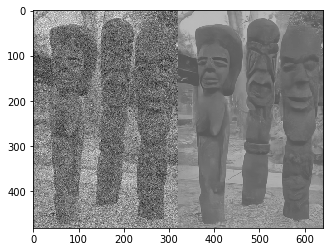

     Set68 : test002.png : 0.0312 second


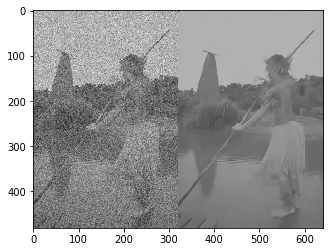

     Set68 : test003.png : 0.0329 second


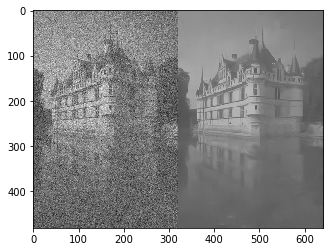

     Set68 : test004.png : 0.0329 second


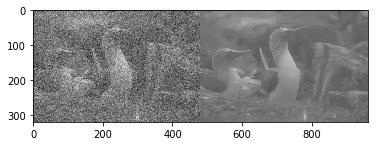

     Set68 : test005.png : 0.0329 second


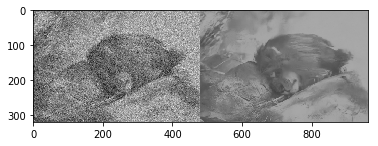

     Set68 : test006.png : 0.0359 second


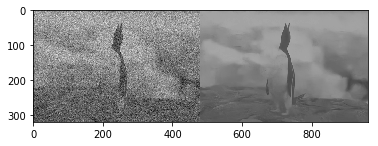

     Set68 : test007.png : 0.0329 second


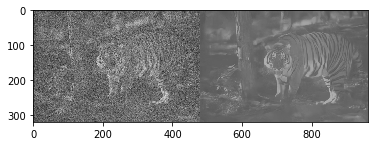

     Set68 : test008.png : 0.0329 second


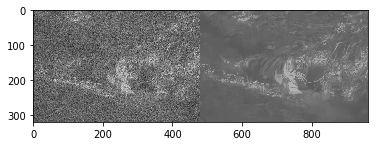

     Set68 : test009.png : 0.0339 second


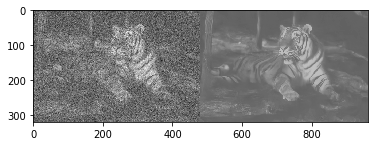

     Set68 : test010.png : 0.0180 second


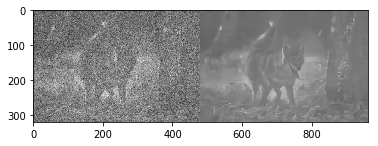

     Set68 : test011.png : 0.0329 second


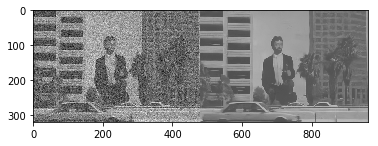

     Set68 : test012.png : 0.0329 second


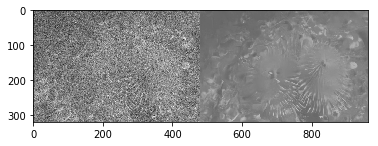

     Set68 : test013.png : 0.0280 second


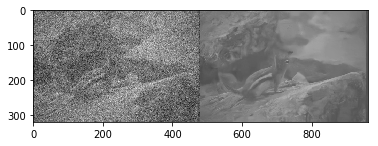

     Set68 : test014.png : 0.0329 second


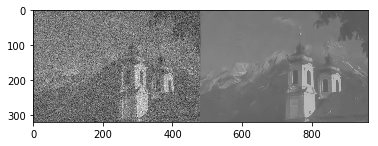

     Set68 : test015.png : 0.0359 second


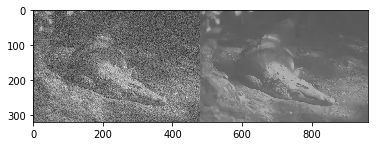

     Set68 : test016.png : 0.0359 second


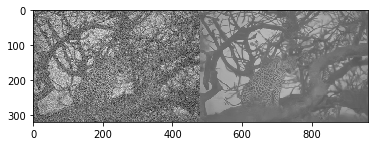

     Set68 : test017.png : 0.0359 second


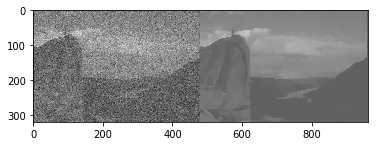

     Set68 : test018.png : 0.0329 second


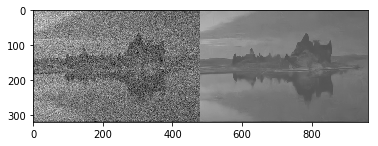

     Set68 : test019.png : 0.0327 second


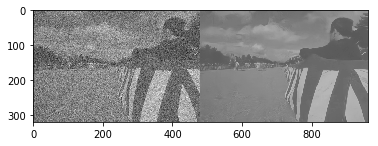

     Set68 : test020.png : 0.0392 second


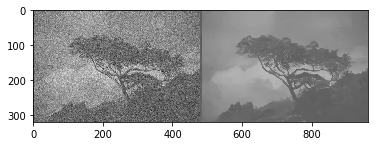

     Set68 : test021.png : 0.0178 second


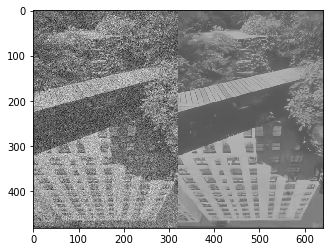

     Set68 : test022.png : 0.0359 second


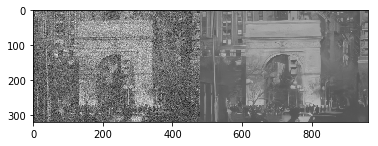

     Set68 : test023.png : 0.0311 second


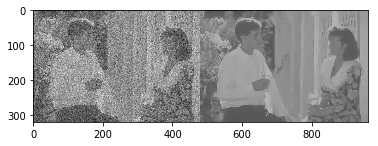

     Set68 : test024.png : 0.0313 second


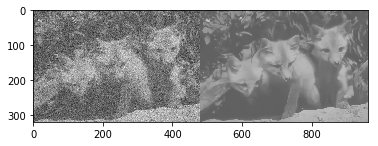

     Set68 : test025.png : 0.0330 second


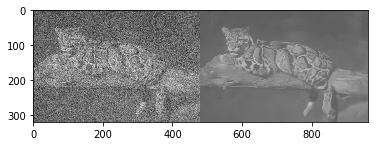

     Set68 : test026.png : 0.0339 second


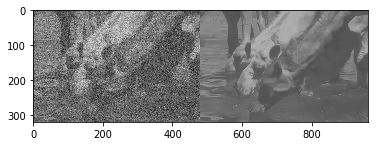

     Set68 : test027.png : 0.0349 second


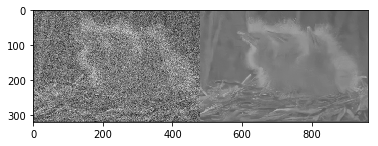

     Set68 : test028.png : 0.0369 second


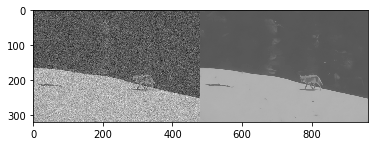

     Set68 : test029.png : 0.0313 second


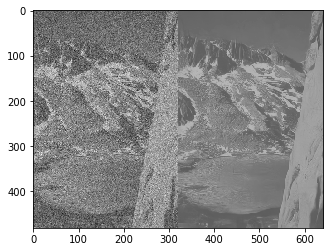

     Set68 : test030.png : 0.0469 second


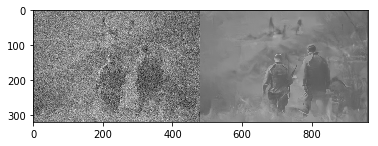

     Set68 : test031.png : 0.0329 second


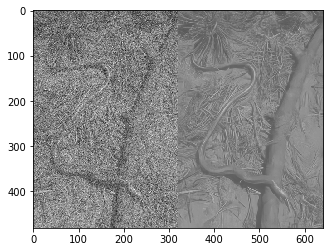

     Set68 : test032.png : 0.0483 second


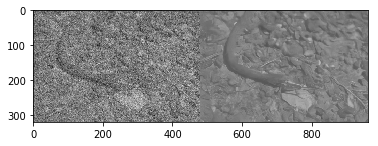

     Set68 : test033.png : 0.0339 second


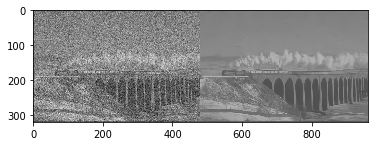

     Set68 : test034.png : 0.0313 second


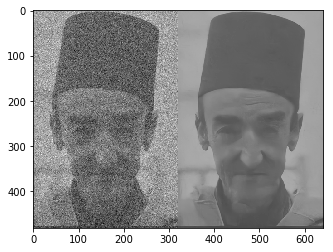

     Set68 : test035.png : 0.0329 second


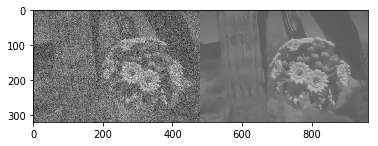

     Set68 : test036.png : 0.0329 second


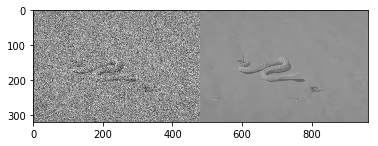

     Set68 : test037.png : 0.0313 second


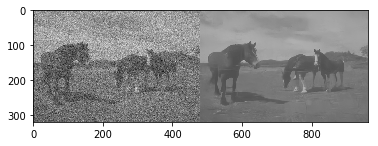

     Set68 : test038.png : 0.0339 second


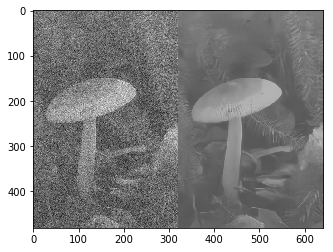

     Set68 : test039.png : 0.0329 second


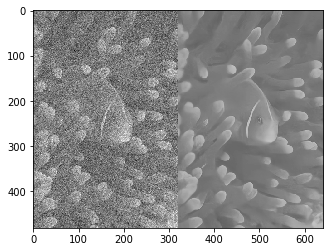

     Set68 : test040.png : 0.0469 second


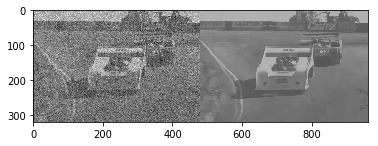

     Set68 : test041.png : 0.0458 second


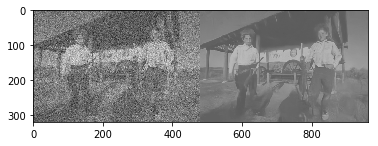

     Set68 : test042.png : 0.0329 second


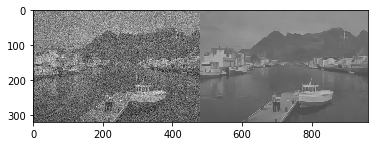

     Set68 : test043.png : 0.0316 second


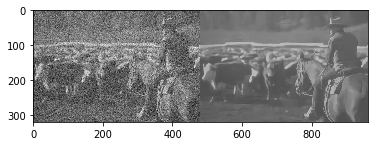

     Set68 : test044.png : 0.0313 second


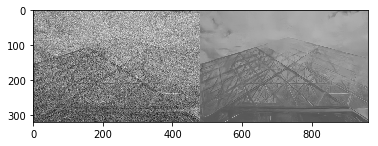

     Set68 : test045.png : 0.0359 second


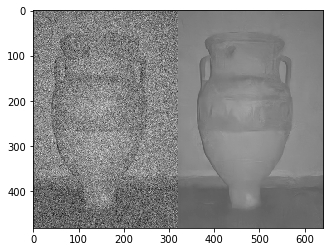

     Set68 : test046.png : 0.0329 second


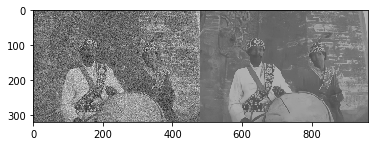

     Set68 : test047.png : 0.0312 second


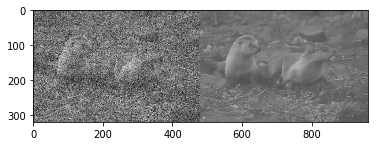

     Set68 : test048.png : 0.0431 second


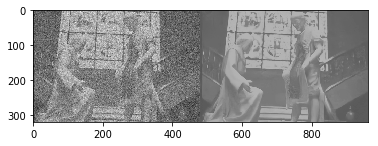

     Set68 : test049.png : 0.0329 second


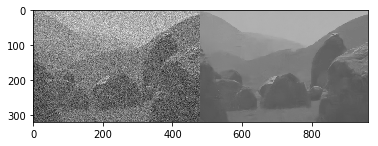

     Set68 : test050.png : 0.0329 second


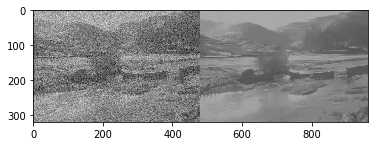

     Set68 : test051.png : 0.0329 second


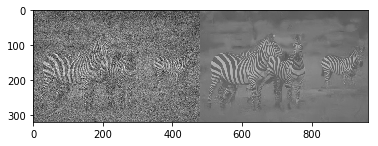

     Set68 : test052.png : 0.0379 second


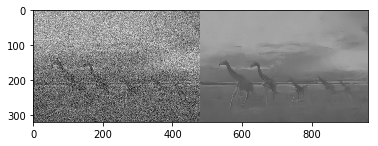

     Set68 : test053.png : 0.0339 second


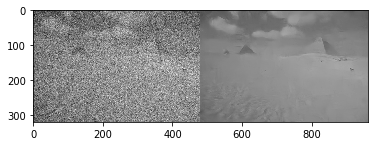

     Set68 : test054.png : 0.0227 second


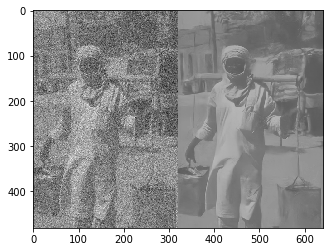

     Set68 : test055.png : 0.0339 second


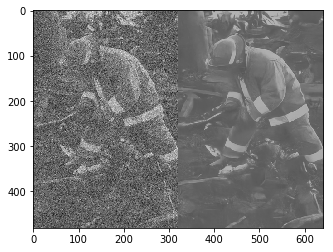

     Set68 : test056.png : 0.0339 second


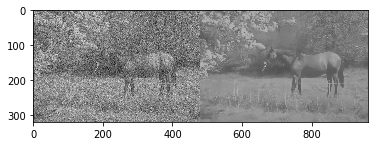

     Set68 : test057.png : 0.0339 second


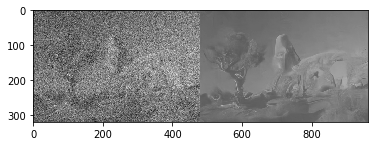

     Set68 : test058.png : 0.0359 second


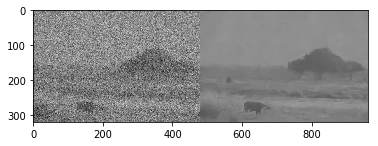

     Set68 : test059.png : 0.0329 second


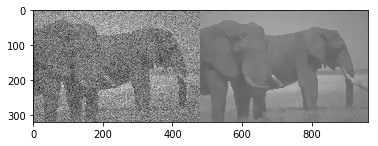

     Set68 : test060.png : 0.0312 second


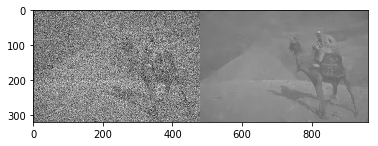

     Set68 : test061.png : 0.0349 second


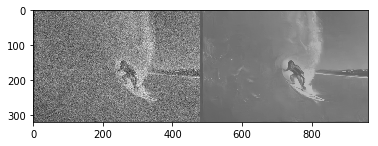

     Set68 : test062.png : 0.0417 second


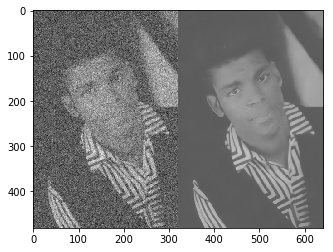

     Set68 : test063.png : 0.0359 second


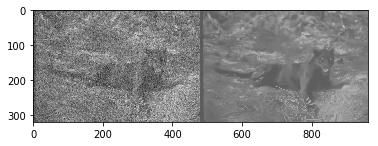

     Set68 : test064.png : 0.0349 second


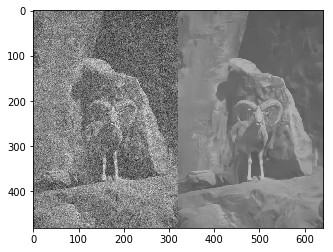

     Set68 : test065.png : 0.0313 second


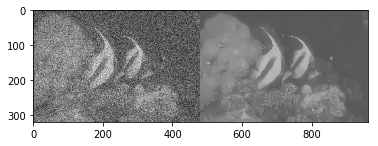

     Set68 : test066.png : 0.0339 second


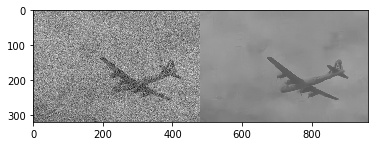

     Set68 : test067.png : 0.0312 second


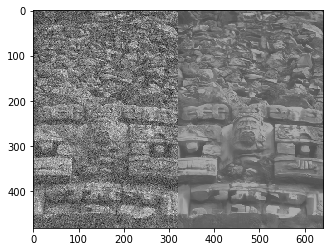

     Set68 : test068.png : 0.0363 second


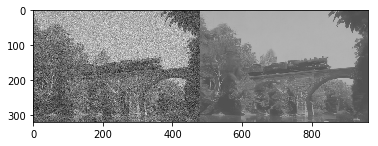

Datset: Set68      
  PSNR = 26.18dB, SSIM = 0.8233


In [5]:
set_dir = 'data/Test'
set_names = ['Set68']
sigma =50
model_dir = 'models'
model_name = 'DNet_s0d20_0407.pth'
result_dir = 'results'

model = torch.load(os.path.join(model_dir, model_name))

model.eval()

print(model)
if torch.cuda.is_available():
    model = model.cuda()

for set_cur in set_names:

    if not os.path.exists(os.path.join(result_dir, set_cur)):
        os.mkdir(os.path.join(result_dir, set_cur))
    psnrs = []
    ssims = []

    for im in os.listdir(os.path.join(set_dir, set_cur)):
        if im.endswith(".jpg") or im.endswith(".bmp") or im.endswith(".png"):
            
            x = np.array(imread(os.path.join(set_dir, set_cur, im)), dtype=np.float32)/255.0
            init_shape = x.shape
                
            np.random.seed(seed=0)  # for reproducibility
            y = x + np.random.normal(0, sigma/255.0, x.shape)  # Add Gaussian noise without clipping
            y = y.astype(np.float32)
            y_ = torch.from_numpy(y).view(1, -1, y.shape[0], y.shape[1])

            torch.cuda.synchronize()
            start_time = time.time()
            y_ = y_.cuda()
            r = model(y_)
            x_ = y_ - r  # inference
            
            x_ = x_.view(y.shape[0], y.shape[1])
            x_ = x_.cpu()
            x_ = x_.detach().numpy().astype(np.float32)
            r = r.view(y.shape[0], y.shape[1])
            r = r.cpu()
            r = r.detach().numpy().astype(np.float32)
            s = x-x_
            s = s.astype(np.float32)
            
            torch.cuda.synchronize()
            elapsed_time = time.time() - start_time
            print('%10s : %10s : %2.4f second' % (set_cur, im, elapsed_time))

            psnr_x_ = compare_psnr(x, x_)
            ssim_x_ = compare_ssim(x, x_)
            
            name, ext = os.path.splitext(im)
            show(np.hstack((y, x_)))  # show the image
            save_result(x_, path=os.path.join(result_dir, set_cur, name+'_d1'+ext))  # save the denoised image
            save_residual(r, path=os.path.join(result_dir, set_cur, name+'_residual2'+ext))  # save the denoised image
            save_structure(s, path=os.path.join(result_dir, set_cur, name+'_structure'+ext))  # save the denoised image
            
            psnrs.append(psnr_x_)
            ssims.append(ssim_x_)
    psnr_avg = np.mean(psnrs)
    ssim_avg = np.mean(ssims)
    psnrs.append(psnr_avg)
    ssims.append(ssim_avg)

    print('Datset: {0:10s} \n  PSNR = {1:2.2f}dB, SSIM = {2:1.4f}'.format(set_cur, psnr_avg, ssim_avg))

## Test SNet

     Set12 :     01.png : 0.0200 second


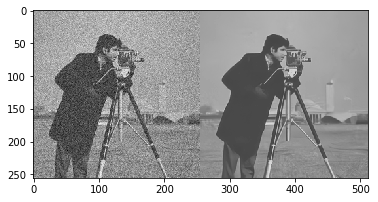

     Set12 :     02.png : 0.0199 second


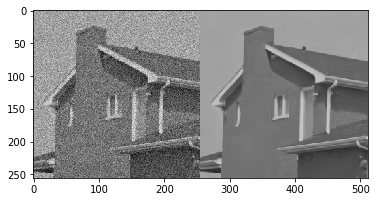

     Set12 :     03.png : 0.0209 second


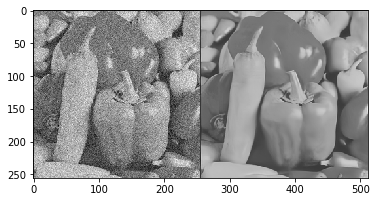

     Set12 :     04.png : 0.0199 second


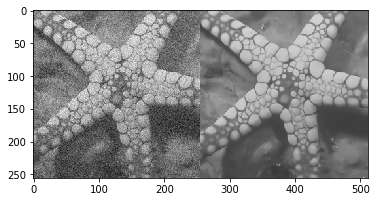

     Set12 :     05.png : 0.0209 second


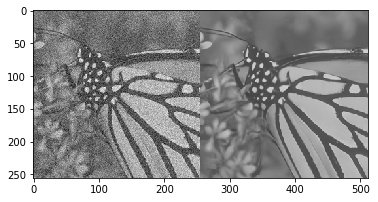

     Set12 :     06.png : 0.0209 second


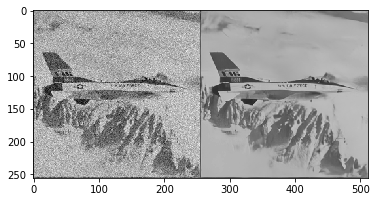

     Set12 :     07.png : 0.0209 second


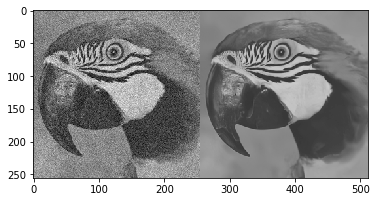

     Set12 :     08.png : 0.0758 second


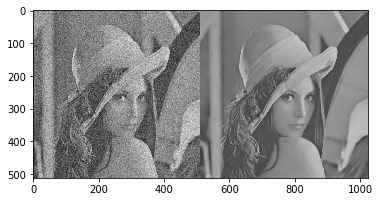

     Set12 :     09.png : 0.0768 second


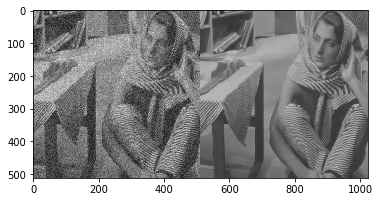

     Set12 :     10.png : 0.0768 second


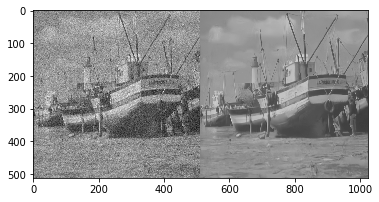

     Set12 :     11.png : 0.0748 second


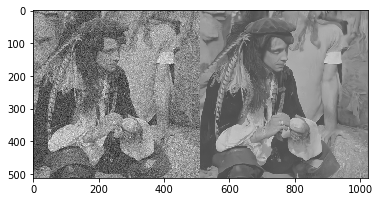

     Set12 :     12.png : 0.0718 second


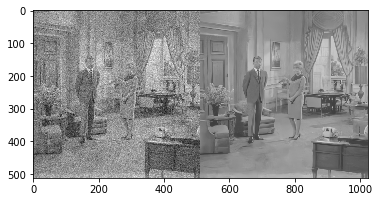

Datset: Set12      
  PSNR = 30.46dB, SSIM = 0.9300
     Set68 : test001.png : 0.0508 second


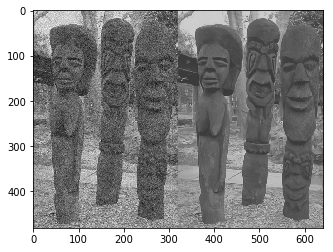

     Set68 : test002.png : 0.0529 second


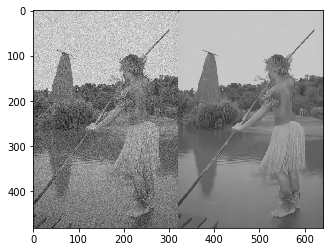

     Set68 : test003.png : 0.0508 second


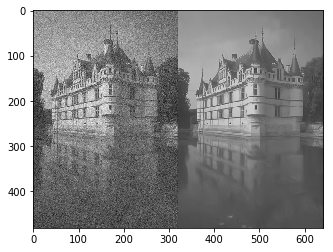

     Set68 : test004.png : 0.0559 second


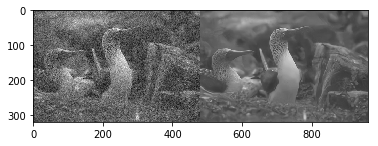

     Set68 : test005.png : 0.0558 second


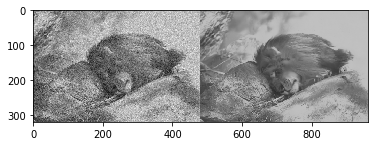

     Set68 : test006.png : 0.0518 second


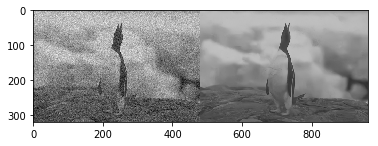

     Set68 : test007.png : 0.0519 second


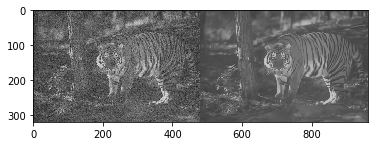

     Set68 : test008.png : 0.0509 second


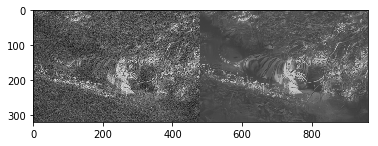

     Set68 : test009.png : 0.0549 second


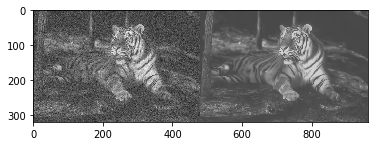

     Set68 : test010.png : 0.0518 second


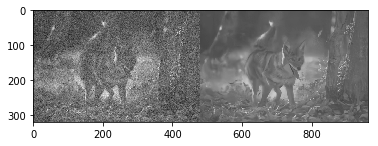

     Set68 : test011.png : 0.0519 second


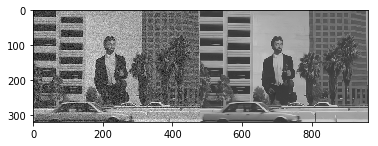

     Set68 : test012.png : 0.0519 second


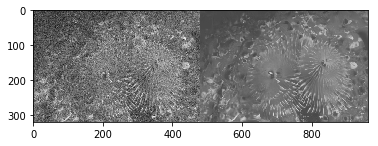

     Set68 : test013.png : 0.0519 second


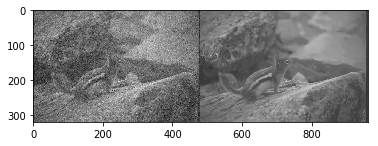

     Set68 : test014.png : 0.0538 second


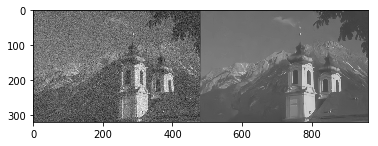

     Set68 : test015.png : 0.0519 second


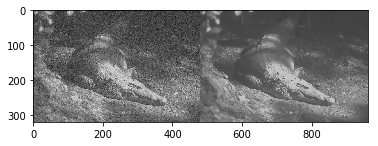

     Set68 : test016.png : 0.0509 second


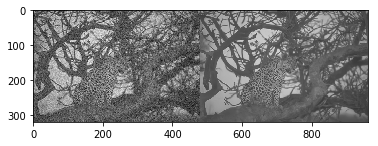

     Set68 : test017.png : 0.0509 second


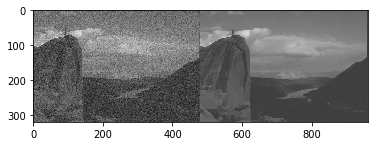

     Set68 : test018.png : 0.0519 second


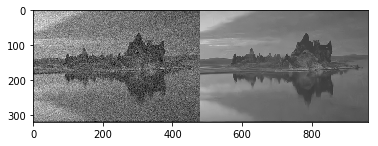

     Set68 : test019.png : 0.0519 second


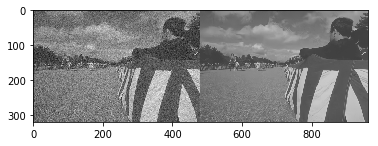

     Set68 : test020.png : 0.0539 second


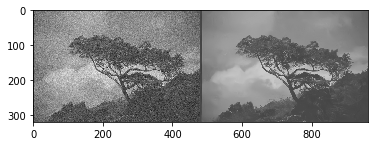

     Set68 : test021.png : 0.0518 second


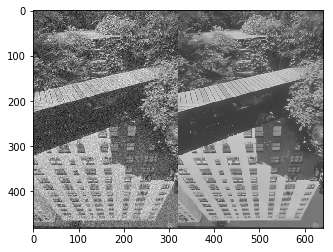

     Set68 : test022.png : 0.0519 second


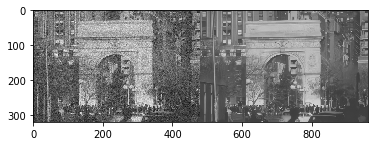

     Set68 : test023.png : 0.0518 second


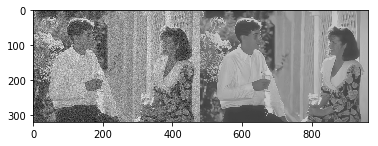

     Set68 : test024.png : 0.0519 second


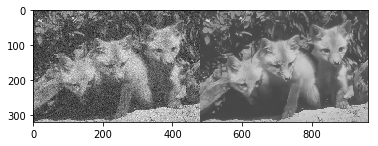

     Set68 : test025.png : 0.0518 second


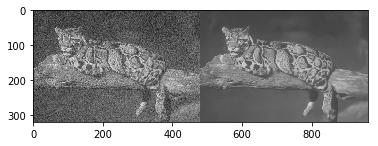

     Set68 : test026.png : 0.0538 second


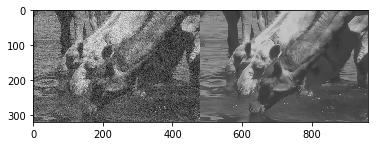

     Set68 : test027.png : 0.0519 second


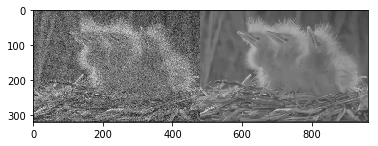

     Set68 : test028.png : 0.0509 second


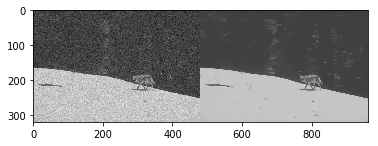

     Set68 : test029.png : 0.0518 second


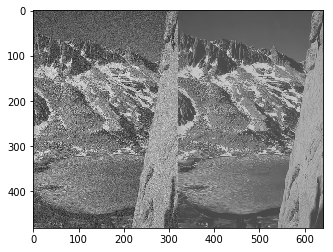

     Set68 : test030.png : 0.0559 second


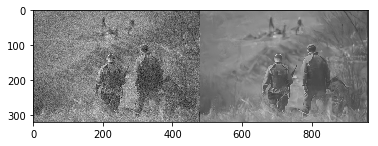

     Set68 : test031.png : 0.0519 second


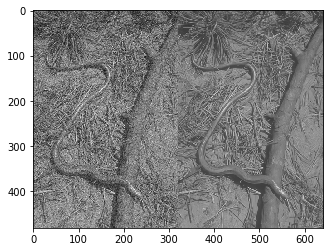

     Set68 : test032.png : 0.0509 second


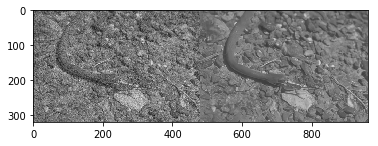

     Set68 : test033.png : 0.0519 second


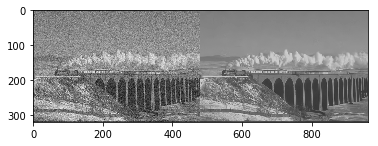

     Set68 : test034.png : 0.0548 second


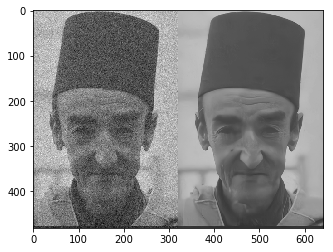

     Set68 : test035.png : 0.0509 second


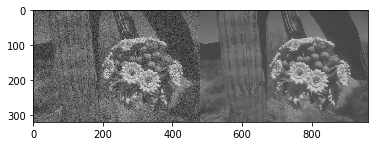

     Set68 : test036.png : 0.0519 second


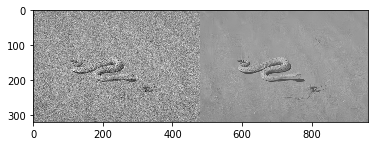

     Set68 : test037.png : 0.0528 second


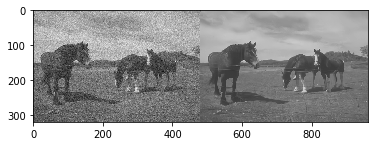

     Set68 : test038.png : 0.0519 second


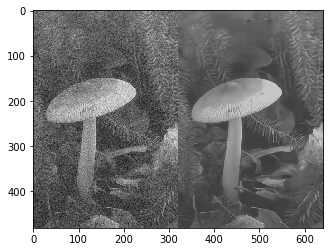

     Set68 : test039.png : 0.0518 second


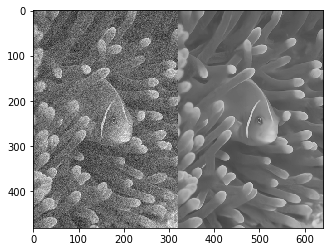

     Set68 : test040.png : 0.0539 second


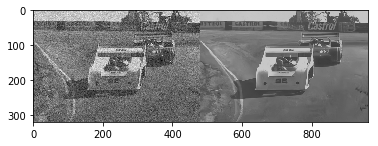

     Set68 : test041.png : 0.0558 second


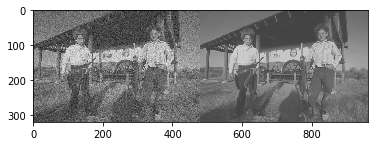

     Set68 : test042.png : 0.0518 second


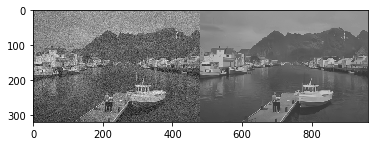

     Set68 : test043.png : 0.0519 second


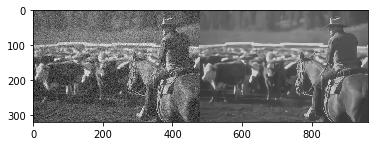

     Set68 : test044.png : 0.0518 second


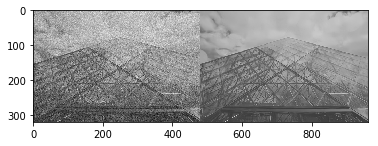

     Set68 : test045.png : 0.0519 second


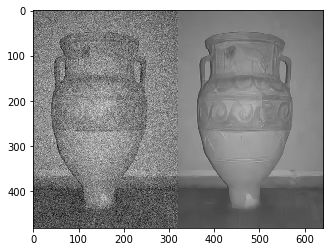

     Set68 : test046.png : 0.0518 second


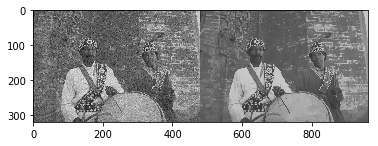

     Set68 : test047.png : 0.0518 second


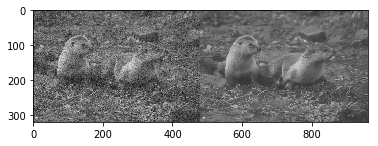

     Set68 : test048.png : 0.0538 second


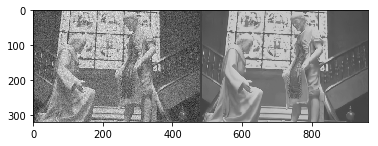

     Set68 : test049.png : 0.0518 second


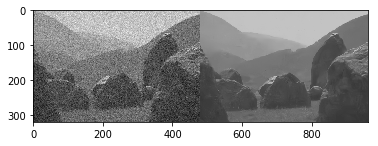

     Set68 : test050.png : 0.0509 second


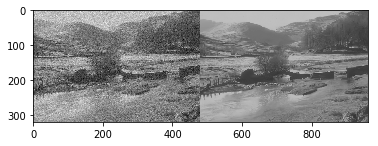

     Set68 : test051.png : 0.0518 second


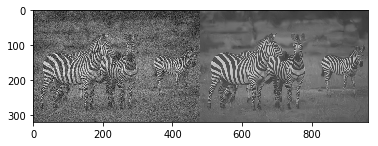

     Set68 : test052.png : 0.0539 second


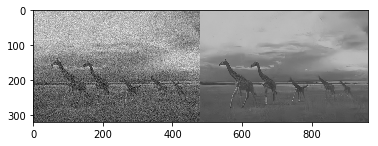

     Set68 : test053.png : 0.0549 second


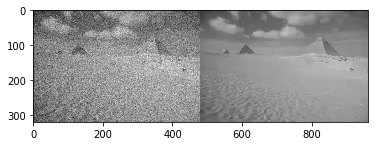

     Set68 : test054.png : 0.0519 second


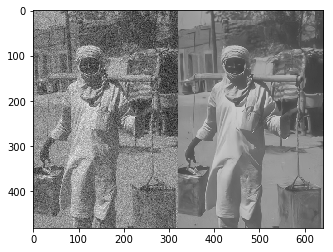

     Set68 : test055.png : 0.0509 second


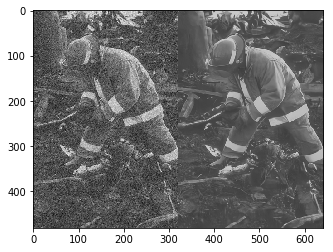

     Set68 : test056.png : 0.0519 second


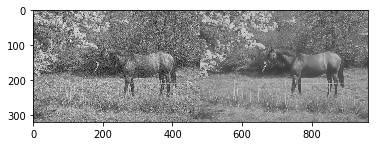

     Set68 : test057.png : 0.0528 second


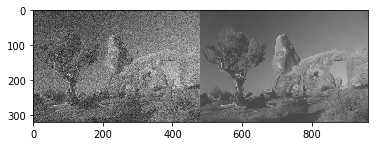

     Set68 : test058.png : 0.0519 second


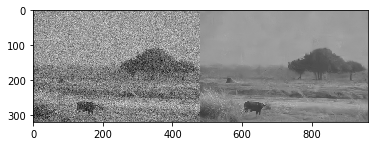

     Set68 : test059.png : 0.0518 second


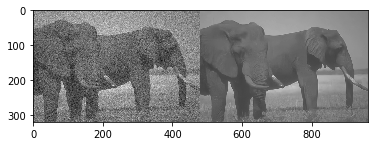

     Set68 : test060.png : 0.0518 second


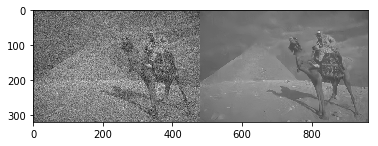

     Set68 : test061.png : 0.0519 second


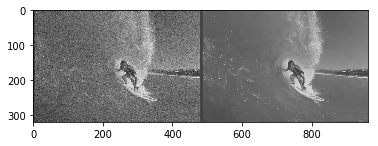

     Set68 : test062.png : 0.0518 second


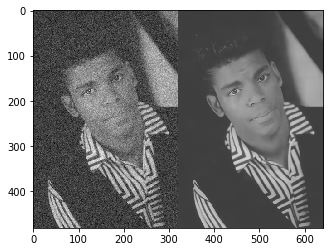

     Set68 : test063.png : 0.0539 second


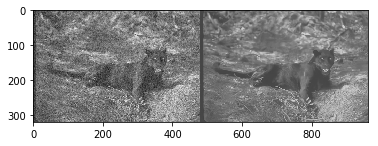

     Set68 : test064.png : 0.0539 second


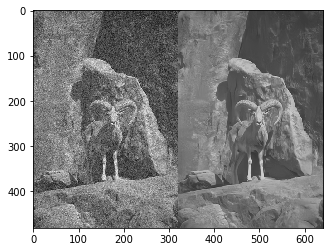

     Set68 : test065.png : 0.0529 second


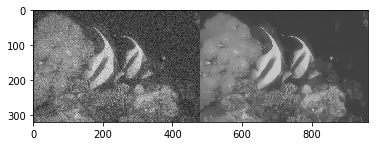

     Set68 : test066.png : 0.0518 second


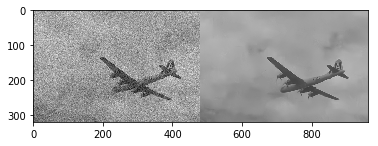

     Set68 : test067.png : 0.0529 second


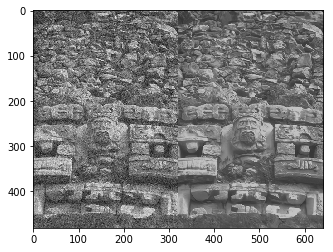

     Set68 : test068.png : 0.0539 second


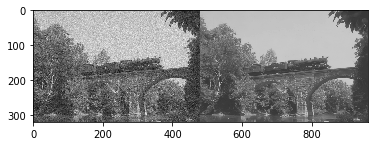

Datset: Set68      
  PSNR = 29.24dB, SSIM = 0.9020


In [4]:
set_dir = 'data/Test'
set_names = ['Set12', 'Set68']
sigma = 25
model_dir = 'models'
d_model_name = 'DNet(sigma=25)_1.pth'
s_model_name = 'SNet_dfver1_0317_epoch001.pth'
result_dir = 'results'

DNet_model = torch.load(os.path.join(model_dir, d_model_name))
SNet_model = torch.load(os.path.join(model_dir, s_model_name))

DNet_model.eval()
SNet_model.eval()

if torch.cuda.is_available():
    DNet_model = DNet_model.cuda()
    SNet_model = SNet_model.cuda()

for set_cur in set_names:

    if not os.path.exists(os.path.join(result_dir, set_cur)):
        os.mkdir(os.path.join(result_dir, set_cur))
    psnrs = []
    ssims = []

    for im in os.listdir(os.path.join(set_dir, set_cur)):
        if im.endswith(".jpg") or im.endswith(".bmp") or im.endswith(".png"):
            
            x = np.array(imread(os.path.join(set_dir, set_cur, im)), dtype=np.float32)/255.0
                
            np.random.seed(seed=0)  # for reproducibility
            y = x + np.random.normal(0, sigma/255.0, x.shape)  # Add Gaussian noise without clipping
            y = y.astype(np.float32)
            y_ = torch.from_numpy(y).view(1, -1, y.shape[0], y.shape[1])

            torch.cuda.synchronize()
            start_time = time.time()
            y_ = y_.cuda()
            r = DNet_model(y_)
            x_ = y_ - r  # inference
            
            s = SNet_model(r, x_)
            x__ = x_+s
            
            x_ = x_.view(y.shape[0], y.shape[1])
            x_ = x_.cpu()
            x_ = x_.detach().numpy().astype(np.float32)
            
            x__ = x__.view(y.shape[0], y.shape[1])
            x__ = x__.cpu()
            x__ = x__.detach().numpy().astype(np.float32)
            
            r = r.view(y.shape[0], y.shape[1])
            r = r.cpu()
            r = r.detach().numpy().astype(np.float32)
            s = s.view(y.shape[0], y.shape[1])
            s = s.cpu()
            s = s.detach().numpy().astype(np.float32)
            
            torch.cuda.synchronize()
            elapsed_time = time.time() - start_time
            print('%10s : %10s : %2.4f second' % (set_cur, im, elapsed_time))

            psnr_x_ = compare_psnr(x, x_)
            ssim_x_ = compare_ssim(x, x_)
            
            name, ext = os.path.splitext(im)
            show(np.hstack((y, x_)))  # show the image
            save_result(x_, path=os.path.join(result_dir, set_cur, name+'_dncnn'+ext))  # save the denoised image
            save_result(x__, path=os.path.join(result_dir, set_cur, name+'_d2'+ext))  # save the denoised image
            save_structure(s, path=os.path.join(result_dir, set_cur, name+'_structure'+ext))  # save the denoised image
            
            psnrs.append(psnr_x_)
            ssims.append(ssim_x_)
    psnr_avg = np.mean(psnrs)
    ssim_avg = np.mean(ssims)
    psnrs.append(psnr_avg)
    ssims.append(ssim_avg)

    print('Datset: {0:10s} \n  PSNR = {1:2.2f}dB, SSIM = {2:1.4f}'.format(set_cur, psnr_avg, ssim_avg))

### Test JFNet

In [7]:
set_dir = 'data/Test'
set_names = ['Set68', 'Set12']
sigma = 50
model_dir = 'models'
model_name = 'model25m6d17/model.pth'
dnet = 'dncnn50(7).pth'
result_dir = 'results'
device = "cuda:0"

dncnn = torch.load(os.path.join(model_dir, dnet))
model = torch.load(os.path.join(model_dir, model_name))
print(model)

model.eval()
dncnn.eval()

if torch.cuda.is_available():
    model = model.to(device)
    dncnn = dncnn.to(device)

for set_cur in set_names:

    if not os.path.exists(os.path.join(result_dir, set_cur)):
        os.mkdir(os.path.join(result_dir, set_cur))
    psnrs = []
    ssims = []

    for im in os.listdir(os.path.join(set_dir, set_cur)):
        if im.endswith(".jpg") or im.endswith(".bmp") or im.endswith(".png"):
            
            x = np.array(imread(os.path.join(set_dir, set_cur, im)), dtype=np.float32)/255.0
            init_shape = x.shape
                
            np.random.seed(seed=0)  # for reproducibility
            y = x + np.random.normal(0, sigma/255.0, x.shape)  # Add Gaussian noise without clipping
            y = y.astype(np.float32)
            
            y_ = torch.from_numpy(y).view(1, -1, y.shape[0], y.shape[1])

            torch.cuda.synchronize()
            start_time = time.time()
            y_ = y_.to(device)
            r = dncnn(y_)
            x_, s, d = model(y_, r)
            x_ = y_-s
            
            r = r.view(y.shape[0], y.shape[1])
            r = r.cpu()
            r = r.detach().numpy().astype(np.float32)
            
            x_ = x_.view(y.shape[0], y.shape[1])
            x_ = x_.cpu()
            x_ = x_.detach().numpy().astype(np.float32)
            
            s = s.view(y.shape[0], y.shape[1])
            s = s.cpu()
            s = s.detach().numpy().astype(np.float32)
            
            torch.cuda.synchronize()
            elapsed_time = time.time() - start_time
            print('%10s : %10s : %2.4f second' % (set_cur, im, elapsed_time))

            psnr_x_ = compare_psnr(x, x_)
            ssim_x_ = compare_ssim(x, x_)
            
            name, ext = os.path.splitext(im)
            #show(np.hstack((y, x_)))  # show the image
            save_result(x_, path=os.path.join(result_dir, set_cur, name+'_denoised'+ext))  # save the denoised image
            save_structure(r, path=os.path.join(result_dir, set_cur, name+'_r1'+ext))  # save the denoised image
            save_structure(s, path=os.path.join(result_dir, set_cur, name+'_r2'+ext))  # save the denoised image

            psnrs.append(psnr_x_)
            ssims.append(ssim_x_)
    psnr_avg = np.mean(psnrs)
    ssim_avg = np.mean(ssims)
    psnrs.append(psnr_avg)
    ssims.append(ssim_avg)

    print('Datset: {0:10s} \n  PSNR = {1:2.2f}dB, SSIM = {2:1.4f}'.format(set_cur, psnr_avg, ssim_avg))

DataParallel(
  (module): Model(
    (net): FFTConv(
      (net1): Sequential(
        (0): Conv2d(2, 2, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(2, eps=0.0001, momentum=0.95, affine=True, track_running_stats=True)
        (2): ReLU(inplace)
        (3): Conv2d(2, 2, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(2, eps=0.0001, momentum=0.95, affine=True, track_running_stats=True)
        (5): ReLU(inplace)
        (6): Conv2d(2, 2, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
    )
  )
)
     Set68 : test001.png : 0.0130 second
     Set68 : test002.png : 0.0130 second
     Set68 : test003.png : 0.0130 second
     Set68 : test004.png : 0.0130 second
     Set68 : test005.png : 0.0130 second
     Set68 : test006.png : 0.0120 second
     Set68 : test007.png : 0.0130 second
     Set68 : test008.png : 0.0156 second
     Set68 : test009.png : 0.0130 second
     Set68 : test010.pn